## **TAREA 2 - VISIÓN DE MÁQUINA**

**Universidad Nacional de Colombia** <br>
**Maestría en Ingeniería - Automatización industrial**

Juan Sebastián Hernandez Reyes; Julián Felipe Molina Grisales

### 1. Implementación de transformadas

Implemente (busque) un código para determinar, en el caso de señales bidimensionales (imágenes), alguna de las siguientes transformadas:

*   Transformada de Hartley.
*   Transformada de Walsh-Hadamard.


---

---





In [4]:
from google.colab import drive 
drive.mount('/content/drive') #Comando para montar carpeta de drive en Google Colab

Mounted at /content/drive


Tamaño de la imagen: (512, 512)




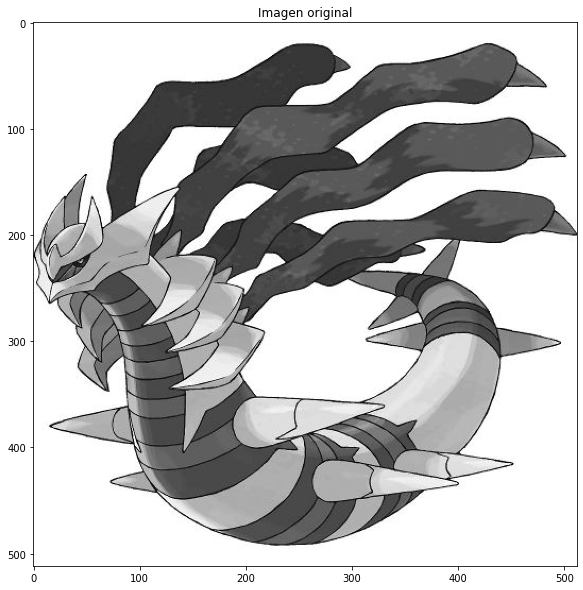

In [5]:
import cv2
import math
from IPython.display import Image
import numpy as np
from math import sin, cos, pi
from matplotlib import pyplot as plt
import scipy.fftpack as sfft

img = cv2.imread('/content/drive/MyDrive/ColabNotebooks/Vision_Maquina/Tarea2/giratina.jpg',0) #Se carga imagen en grises
N, M = img.shape[:2]               #Tamaño de la imagen
print("Tamaño de la imagen: ({}, {})".format(N,M))
print('\n')

plt.figure(figsize=(10,10))
plt.imshow(img, cmap=plt.cm.gray), plt.title('Imagen original')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log10


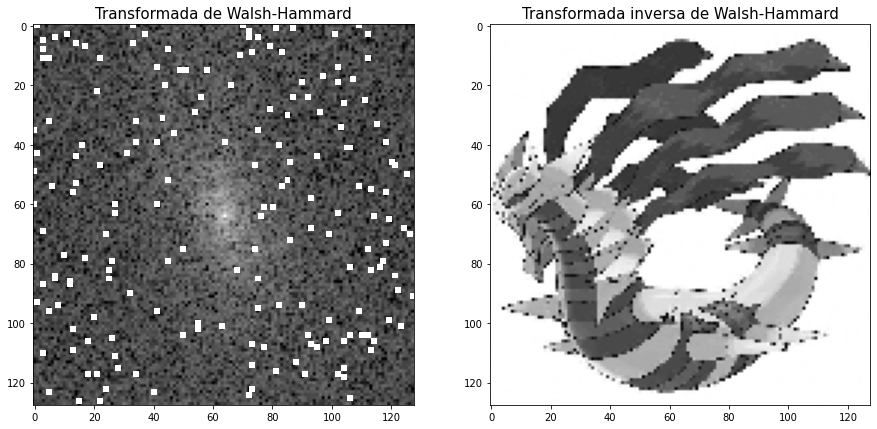

In [15]:
# Hartley Transform
def dht2D(imagen):
    N = imagen.shape[0]                           # Se averigua el tamaño de la imagen
    dht = np.zeros(shape=(N,N), dtype=np.int32) # Se crean matrices de enteros las cuales se usaran para mostrar el resultad
    for a in range(0, N):
        for b in range(0, N):
            suma = 0
            for i in range(0, N):
                for j in range(0, N):
                    suma += imagen[i,j]*(cos((2*pi/N)*(a*i + b*j)) + sin((2*pi/N)*(a*i + b*j)))
            # Factor de escala
            dht[a,b]=int(round(suma/N))  
    return dht

# Hartley inverse transform
def idht2D(dht_imagen):
    N = dht_imagen.shape[0]                           # Se averigua el tamaño de la imagen
    idht = np.zeros(shape=(N,N), dtype=np.int32) # Se crean matrices de enteros las cuales se usaran para mostrar el resultad
    for a in range(0, N):
        for b in range(0, N):
            suma = 0
            for i in range(0, N):
                for j in range(0, N):
                    suma += dht_imagen[i,j]*(cos((2*pi/N)*(a*i + b*j)) + sin((2*pi/N)*(a*i + b*j)))
            # Factor de escala
            idht[a,b]=int(round(suma/N))
    return idht

#Se reduce el tamaño para que el algoritmo tarde menos
img_red=cv2.resize(img, (128,128), interpolation = cv2.INTER_NEAREST)
img_H=dht2D(img_red)
img_H_mod=20*np.log10(np.abs(sfft.fftshift(img_H)))
img_H_inv=idht2D(img_H)

plt.figure(figsize=(15,15))
plt.subplot(121),plt.imshow(img_H_mod, cmap=plt.cm.gray), plt.title('Transformada de Walsh-Hammard',fontsize=15)
plt.subplot(122),plt.imshow(img_H_inv, cmap=plt.cm.gray), plt.title('Transformada inversa de Walsh-Hammard',fontsize=15)
plt.show()

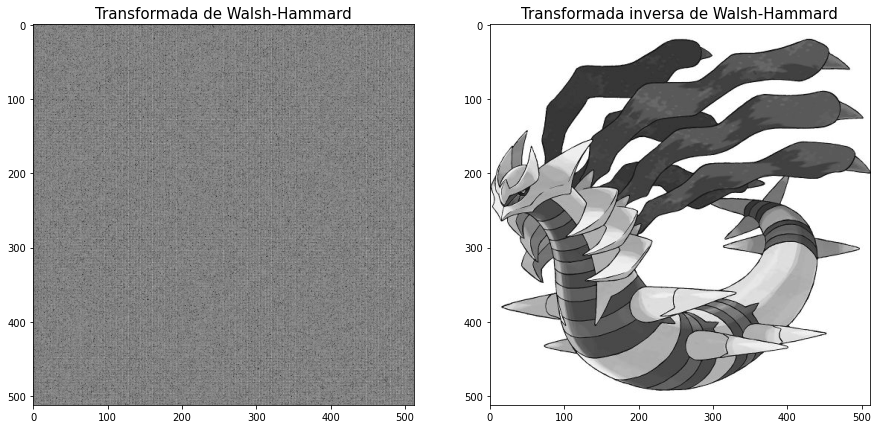

In [40]:
def wh_matrix(N):
  if N == 2:
    H2 = np.array([[1, 1],
                  [1, -1]])
    return H2
  return np.block([[wh_matrix(N//2), wh_matrix(N//2)],
                  [wh_matrix(N//2), -wh_matrix(N//2)]])
  
def wht2D(img):
  N = img.shape[0]
  H = wh_matrix(N)
  A = H/np.sqrt(N)
  A_inv = np.linalg.inv(A)
  imgT = A @ img @ A_inv
  return imgT

def iwht2D(wht_imagen):
    # Se averigua el tamaño de la imagen
    N = wht_imagen.shape[0]   
    # Se calcula la inversa de la matriz A
    A = wh_matrix(N)
    A_inv = np.linalg.inv(A)
    # Calculate Walsh Hadamard Transform
    img_iWH = A @ wht_imagen @ A_inv
    return img_iWH

img_WH=wht2D(img)
vis_img_WH = 20*np.log10(np.abs(img_WH))
img_iWH=iwht2D(img_WH)

plt.figure(figsize=(15,15))
plt.subplot(121),plt.imshow(vis_img_WH, cmap=plt.cm.gray), plt.title('Transformada de Walsh-Hammard',fontsize=15)
plt.subplot(122),plt.imshow(img_iWH, cmap=plt.cm.gray), plt.title('Transformada inversa de Walsh-Hammard',fontsize=15)
plt.show()



### 2. Análisis de comportamiento en compresión
Analice detalladamente el comportamiento, de al menos cuatro de las transformadas estudiadas, cuando ellas son empleadas para compresión de imágenes. Utilice imágenes reales y sintéticas.


---

---





* La compresión de imágenes digitales es una técnica utilizada para reducir su costo de almacenamiento, procesamiento y transmisión.
* Hay métodos de compresión con pérdidas de información y sin pérdidas de información.
* Los métodos que usan transformaciones de dominios son comunmente utilizados, son métodos con pérdidas de información.

Se va a hacer el análisis con las transformadas: 

1.   Fast Fourier Transform (Transformada discreta de Fouirer FFT)
2.   Transformada del coseno (DCT)
3.   Transformada del seno (DST)
4.   Tranformada de Walsh-Hammard (WHT)

Donde se va a comprimir 2 imágenes usando las transformadas mencionadas, luego se reconstruira la imagen usando diferentes niveles de información obtenida y se evaluara su desempeño.

In [41]:
from scipy.fftpack import fftshift, dct, idct, dst, idst
from numpy.linalg import inv
from math import sin, cos, pi
from numpy.fft import fft2, ifft2


#Definimos las funciones que nos permitiran manejar todas las trasnformadas

def fft2D(x):
    return fftshift(fft2(x))

def dct2D(x):
    return dct(dct(x.T, norm='ortho').T, norm='ortho')

def dst2D(x):
    return dst(dst(x.T, norm='ortho').T, norm='ortho')

def ifft2D(x):
    return np.abs(ifft2(fftshift(x)))

def idct2D(x):
    return np.abs(idct(idct(x.T, norm='ortho').T, norm='ortho'))

def idst2D(x):
    return np.abs(idst(idst(x.T, norm='ortho').T, norm='ortho'))

In [52]:
#Se definen las funciones para hacer las reconstrucciones de las imágenes 
NUM_RECONS=10

def reconstruct_fft(fft_img):
    # Reconstruir imágen cada vez con más información
    rows, cols = fft_img.shape
    crow, ccol = rows/2, cols/2
    reconstructed_images = []
    for i in range(NUM_RECONS):
        # Crear un filtro digital 2D tipo escalón (centro 1 y bordes 0)
        mask = np.zeros((rows, cols), np.uint8)
        left_gap, right_gap = 1.0 - i/(1.0*NUM_RECONS), 1.0 + i/(1.0*NUM_RECONS)
        mask[int(crow*left_gap) : int(crow*right_gap) , int(ccol*left_gap) : int(ccol*right_gap)] = 1
        # Aplicar máscara y transformada iDFT
        reconstructed_images.append(ifft2D(fft_img*mask))
    reconstructed_images.append(ifft2D(fft_img))
    return reconstructed_images

def reconstruct_dct(dct_img):
    # Reconstruir imágen cada vez con más información
    rows, cols = dct_img.shape
    crow, ccol = rows/2, cols/2
    reconstructed_images = []
    for i in range(NUM_RECONS):
        # Crear un filtro digital 2D tipo escalón (centro 1 y bordes 0)
        mask = np.zeros((rows, cols), np.uint8)
        height, width = int(i*rows/NUM_RECONS), int(i*cols/NUM_RECONS)
        mask[:height,:width] = 1
        # Aplicar máscara y transformada iDFT
        reconstructed_images.append(idct2D(dct_img*mask))
    reconstructed_images.append(idct2D(dct_img))
    return reconstructed_images

def reconstruct_dst(dst_img):
    # Reconstruir imágen cada vez con más información
    rows, cols = dst_img.shape
    crow, ccol = rows/2, cols/2
    reconstructed_images = []
    for i in range(NUM_RECONS):
        # Crear un filtro digital 2D tipo escalón (centro 1 y bordes 0)
        mask = np.zeros((rows, cols), np.uint8)
        height, width = int(i*rows/NUM_RECONS), int(i*cols/NUM_RECONS)
        mask[:height,:width] = 1
        # Aplicar máscara y transformada iDFT
        reconstructed_images.append(idst2D(dst_img*mask))
    reconstructed_images.append(idst2D(dst_img))
    return reconstructed_images

def reconstruct_wht(wht_img):
    # Reconstruir imágen cada vez con más información
    rows, cols = wht_img.shape
    crow, ccol = rows/2, cols/2
    reconstructed_images = []
    for i in range(NUM_RECONS):
        # Crear un filtro digital 2D tipo escalón (centro 1 y bordes 0)
        mask = np.zeros((rows, cols), np.uint8)
        height, width = int(i*rows/NUM_RECONS), int(i*cols/NUM_RECONS)
        mask[:height,:width] = 1
        # Aplicar máscara y transformada iDFT
        reconstructed_images.append(iwht2D(wht_img*mask))
    reconstructed_images.append(iwht2D(wht_img))
    return reconstructed_images

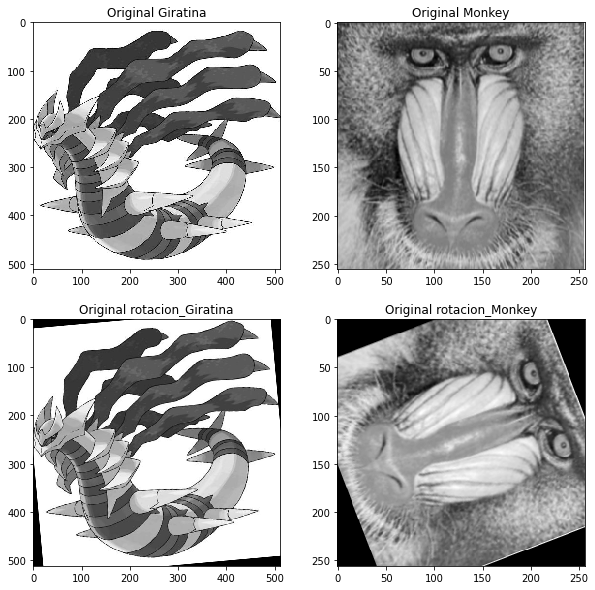

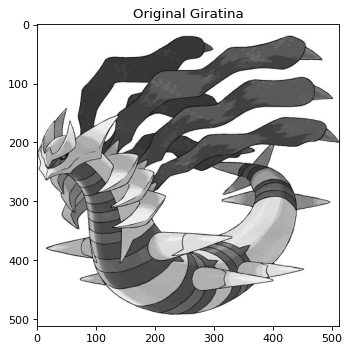

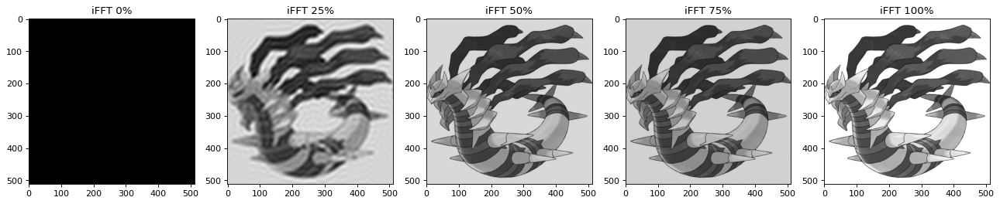

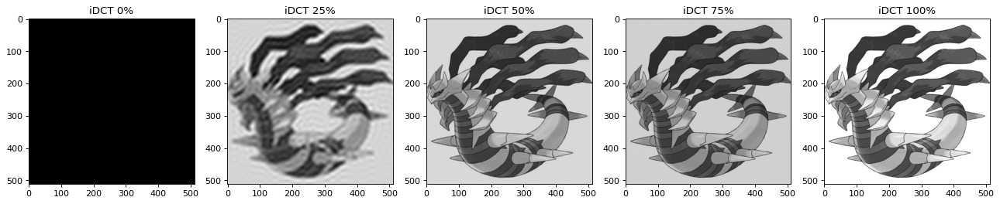

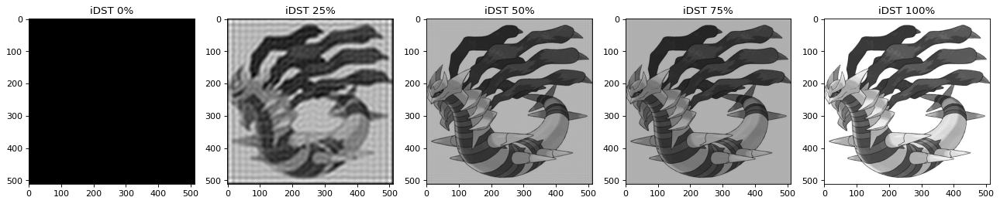

...

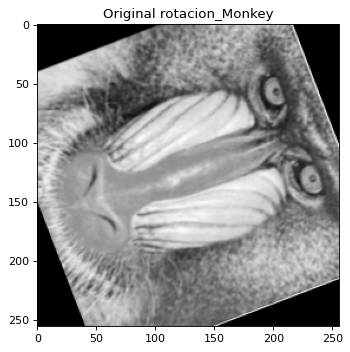

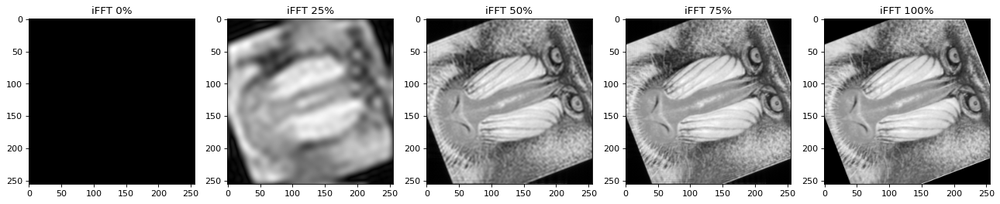

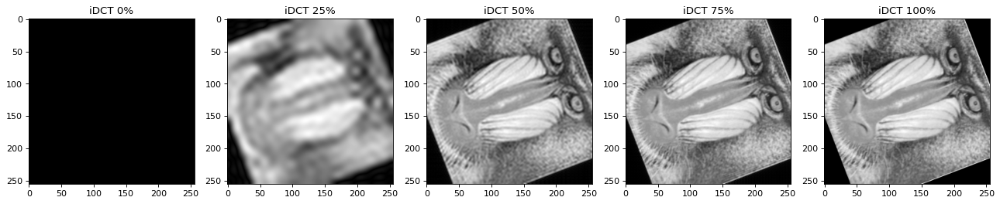

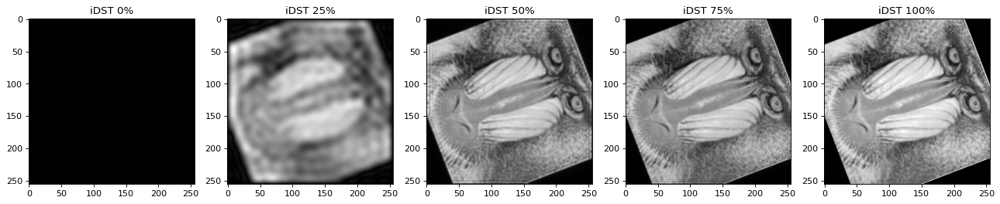

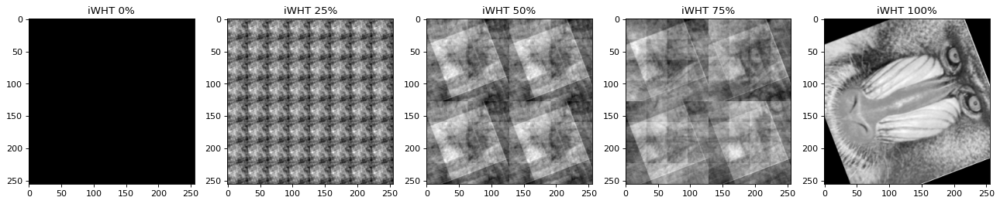

In [61]:
# Cargar imagenes
img2=cv2.imread('/content/drive/MyDrive/ColabNotebooks/Vision_Maquina/Tarea2/monkey.png',0) #Se carga imagen en grises
img2=cv2.resize(img2, (256,256), interpolation = cv2.INTER_CUBIC)
imagenes = [img,img2]
nombres = ['Giratina','Monkey']

# Generar imagenes sintéticas (rotadas) a aprtir de las originales
for i in range(len(imagenes)):
    num_rows, num_cols = imagenes[i].shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), randrange(-90,90), 1)
    imagenes.append(cv2.warpAffine(imagenes[i], rotation_matrix, (num_cols, num_rows)))
    nombres.append('rotacion_' + nombres[i])

# Visualizar imagenes originales
m_size = len(imagenes)
rows_cols = int(math.ceil(math.sqrt(m_size)))
plt.figure(num=None, figsize=(10, 10), facecolor='w', edgecolor='k')
for i in range(len(imagenes)):
    plt.subplot(rows_cols, rows_cols, i+1)
    plt.title('Original %s'%(nombres[i]))
    plt.imshow(imagenes[i], interpolation='none', cmap='gray')
plt.show()

# Transformaciones sobre las imagenes
fft_imagenes = [] # Fast Fourier Transform
wht_imagenes = [] # Discrete Fourier Transform
dct_imagenes = [] # Discrete Cosine Transform
dst_imagenes = [] # Discrete Cosine Transform
for i in range(len(imagenes)):
    fft_imagenes.append(fft2D(imagenes[i]))
    dct_imagenes.append(dct2D(imagenes[i]))
    dst_imagenes.append(dst2D(imagenes[i]))
    wht_imagenes.append(wht2D(imagenes[i]))

# Reconstrucción de imágenes
imagenes_fft = [] # Imagenes reconstruidas mediante filtrado del espectro FFT
imagenes_wht = [] # Imagenes reconstruidas mediante filtrado del espectro DFT
imagenes_dct = [] # Imagenes reconstruidas mediante filtrado del espectro DCT
imagenes_dst = [] # Imagenes reconstruidas mediante filtrado del espectro DST
for i in range(m_size):
    imagenes_fft.append(reconstruct_fft(fft_imagenes[i]))
    imagenes_dct.append(reconstruct_dct(dct_imagenes[i]))
    imagenes_dst.append(reconstruct_dst(dst_imagenes[i]))
    imagenes_wht.append(reconstruct_wht(wht_imagenes[i]))
# Visualizar Resultados
for i in range(m_size):
    # Para cada una de las imagenes mostra las 4 transformadas
    fig = plt.figure(num=None, figsize=(5, 5), dpi=80, facecolor='w', edgecolor='k')
    plt.imshow(imagenes[i], cmap = 'gray'), plt.title('Original %s'%(nombres[i]))
    plt.show()
    # iFFT
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_fft[i][0], cmap = 'gray')
    plt.title('iFFT 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_fft[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iFFT 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_fft[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iFFT 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_fft[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iFFT 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_fft[i][NUM_RECONS], cmap = 'gray')
    plt.title('iFFT 100%')
    plt.show()
    # iDCT
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_dct[i][0], cmap = 'gray')
    plt.title('iDCT 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_dct[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDCT 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_dct[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iDCT 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_dct[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDCT 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_dct[i][NUM_RECONS], cmap = 'gray')
    plt.title('iDCT 100%')
    plt.show()
    # iDST
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_dst[i][0], cmap = 'gray')
    plt.title('iDST 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_dst[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDST 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_dst[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iDST 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_dst[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDST 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_dst[i][NUM_RECONS], cmap = 'gray')
    plt.title('iDST 100%')
    plt.show()
    # iWHT
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_wht[i][0], cmap = 'gray')
    plt.title('iWHT 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_wht[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iWHT 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_wht[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iWHT 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_wht[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iWHT 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_wht[i][NUM_RECONS], cmap = 'gray')
    plt.title('iWHT 100%')
    plt.show()

### 3.   Análisis de comportamiento en reducción de ruido
Analice detalladamente el comportamiento, de al menos cuatro de las transformadas estudiadas, cuando ellas son empleadas para reducción de ruido en imágenes. Utilice imágenes reales y sintéticas.


---

---





In [68]:
print(range(4))

range(0, 4)


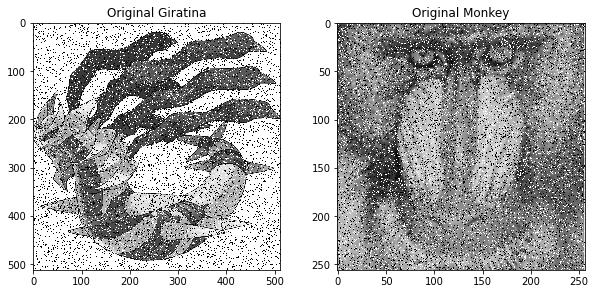

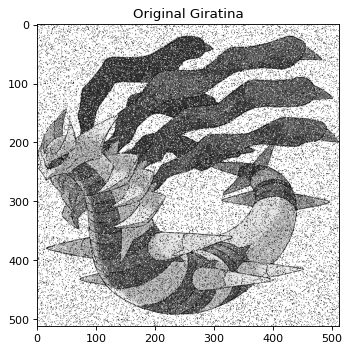

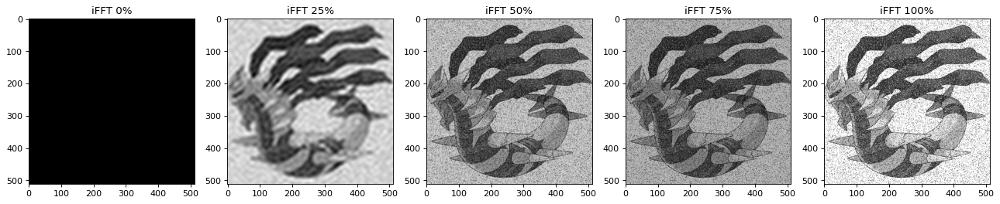

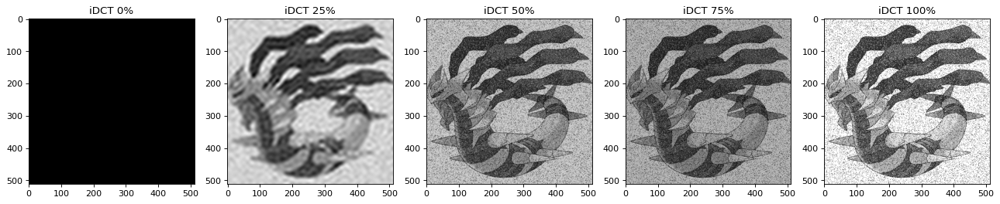

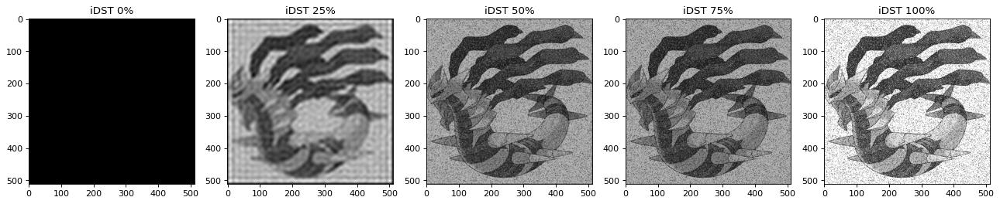

...

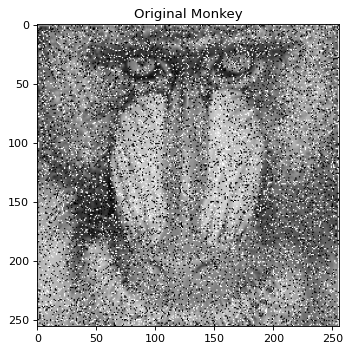

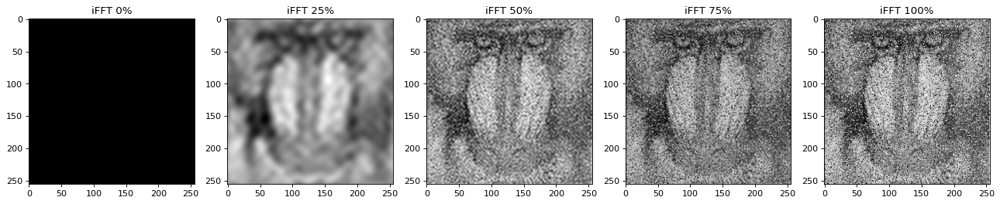

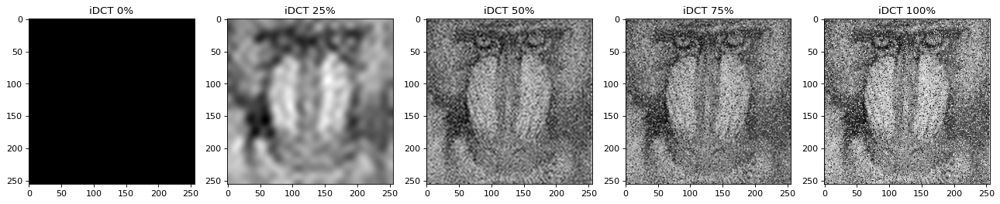

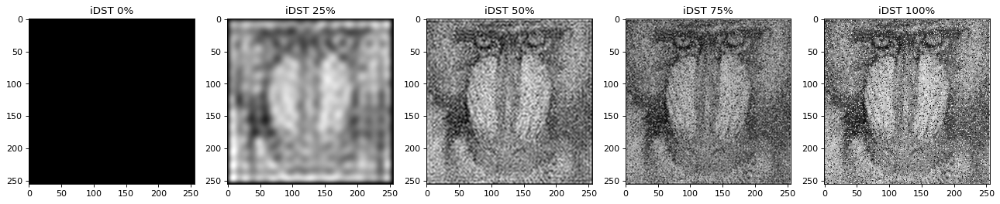

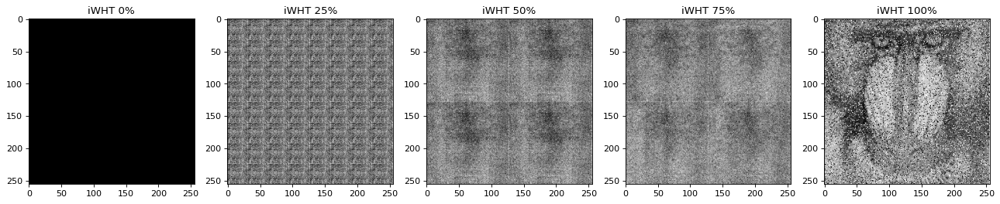

In [70]:
def sp_noise(image, prob):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = np.random.uniform()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

imagenes = [img,img2]
nombres = ['Giratina','Monkey']

# Añadir ruido a las imagenes
for i in range(len(imagenes)):
    imagenes[i]=(sp_noise(imagenes[i], 0.1))

# Visualizar imagenes originales
m_size = len(imagenes)
rows_cols = int(math.ceil(math.sqrt(m_size)))
plt.figure(num=None, figsize=(10, 10), facecolor='w', edgecolor='k')
for i in range(len(imagenes)):
    plt.subplot(rows_cols, rows_cols, i+1)
    plt.title('Original %s'%(nombres[i]))
    plt.imshow(imagenes[i], interpolation='none', cmap='gray')
plt.show()

# Transformaciones sobre las imagenes
fft_imagenes = [] # Fast Fourier Transform
wht_imagenes = [] # Discrete Fourier Transform
dct_imagenes = [] # Discrete Cosine Transform
dst_imagenes = [] # Discrete Cosine Transform
for i in range(len(imagenes)):
    fft_imagenes.append(fft2D(imagenes[i]))
    dct_imagenes.append(dct2D(imagenes[i]))
    dst_imagenes.append(dst2D(imagenes[i]))
    wht_imagenes.append(wht2D(imagenes[i]))

# Reconstrucción de imágenes
imagenes_fft = [] # Imagenes reconstruidas mediante filtrado del espectro FFT
imagenes_wht = [] # Imagenes reconstruidas mediante filtrado del espectro DFT
imagenes_dct = [] # Imagenes reconstruidas mediante filtrado del espectro DCT
imagenes_dst = [] # Imagenes reconstruidas mediante filtrado del espectro DST
for i in range(m_size):
    imagenes_fft.append(reconstruct_fft(fft_imagenes[i]))
    imagenes_dct.append(reconstruct_dct(dct_imagenes[i]))
    imagenes_dst.append(reconstruct_dst(dst_imagenes[i]))
    imagenes_wht.append(reconstruct_wht(wht_imagenes[i]))
# Visualizar Resultados
for i in range(m_size):
    # Para cada una de las imagenes mostra las 4 transformadas
    fig = plt.figure(num=None, figsize=(5, 5), dpi=80, facecolor='w', edgecolor='k')
    plt.imshow(imagenes[i], cmap = 'gray'), plt.title('Original %s'%(nombres[i]))
    plt.show()
    # iFFT
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_fft[i][0], cmap = 'gray')
    plt.title('iFFT 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_fft[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iFFT 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_fft[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iFFT 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_fft[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iFFT 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_fft[i][NUM_RECONS], cmap = 'gray')
    plt.title('iFFT 100%')
    plt.show()
    # iDCT
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_dct[i][0], cmap = 'gray')
    plt.title('iDCT 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_dct[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDCT 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_dct[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iDCT 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_dct[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDCT 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_dct[i][NUM_RECONS], cmap = 'gray')
    plt.title('iDCT 100%')
    plt.show()
    # iDST
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_dst[i][0], cmap = 'gray')
    plt.title('iDST 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_dst[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDST 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_dst[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iDST 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_dst[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iDST 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_dst[i][NUM_RECONS], cmap = 'gray')
    plt.title('iDST 100%')
    plt.show()
    # iWHT
    fig = plt.figure(num=None, figsize=(20, 20), dpi=80, facecolor='w', edgecolor='k')
    plt.subplot(1,5,1), plt.imshow(imagenes_wht[i][0], cmap = 'gray')
    plt.title('iWHT 0%')
    plt.subplot(1,5,2), plt.imshow(imagenes_wht[i][int(NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iWHT 25%')
    plt.subplot(1,5,3), plt.imshow(imagenes_wht[i][int(NUM_RECONS/2)-1], cmap = 'gray')
    plt.title('iWHT 50%')
    plt.subplot(1,5,4), plt.imshow(imagenes_wht[i][int(3*NUM_RECONS/4)-1], cmap = 'gray')
    plt.title('iWHT 75%')
    plt.subplot(1,5,5), plt.imshow(imagenes_wht[i][NUM_RECONS], cmap = 'gray')
    plt.title('iWHT 100%')
    plt.show()